# Generation of the Feature Visualization Baseline

In [1]:
import os
import numpy as np

import tensorflow as tf
from tensorflow.keras.optimizers import *

from matplotlib import pyplot as plt
# plt.style.use('seaborn')
%config InlineBackend.figure_format = 'retina'

def set_size(w,h):
  """Set matplot figure size"""
  plt.rcParams["figure.figsize"] = [w,h]

def show(img):
  img = np.array(img)
  img -= img.min()
  img /= img.max()
  plt.imshow(img)
  plt.axis('off')

import seaborn as sns
sns.set(font_scale=0.9)

def r(n):
  return round(float(n), 3)

def clip_percentile(img, p=0.1):
  return np.clip(img, np.percentile(img, p), np.percentile(img, 100-p))

2024-07-01 17:04:02.482757: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-01 17:04:03.440092: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cudnn/11.8-v8.8.1/cuda/lib64:/usr/local/cuda-11.8/lib64
2024-07-01 17:04:03.440167: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cudnn/11.8-v8.8.1/cuda/lib64:/usr/local/cuda-11.8/li

In [2]:
from scipy.ndimage import gaussian_filter as gaussian
import PIL

def plot(t):
  """ Remove outlier and plot image """
  t = clip_percentile(t, 0.1)
  t -= t.mean(); t /= t.std()
  t -= t.min(); t /= t.max()
  plt.imshow(t)
  plt.axis('off')

def plot_alpha(t, tr):
  """ Remove outlier and plot image (take care of merging the alpha) """
  t = clip_percentile(img, 0.1)
  t -= t.mean(); t /= t.std()
  t -= t.min(); t /= t.max()

  tr = np.mean(tr, -1, keepdims=True)
  tr = gaussian(tr, sigma=50)
  tr = np.clip(tr, 0, np.percentile(tr, 75))
  tr /= tr.max()

  viz = np.concatenate([t, tr], -1)
  plt.imshow(viz)
  plt.axis('off')

  return viz

In [3]:
imagenet_color_correlation = tf.cast(
      [[0.56282854, 0.58447580, 0.58447580],
       [0.19482528, 0.00000000,-0.19482528],
       [0.04329450,-0.10823626, 0.06494176]], tf.float32
)

def recorrelate_colors(images):
    images_flat = tf.reshape(images, [-1, 3])
    images_flat = tf.matmul(images_flat, imagenet_color_correlation)
    return tf.reshape(images_flat, tf.shape(images))

2024-07-01 17:04:13.554386: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-01 17:04:13.554691: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-01 17:04:13.582327: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-01 17:04:13.582567: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-01 17:04:13.582781: I tensorflow/compiler/xla/stream_executo

### Load some pre-trained models to generate some different baselines

In [4]:
from kecam import beit, flexivit

In [5]:
model_vit = flexivit.FlexiViTSmall(input_shape=(240, 240, 3), classifier_activation="linear")
model = tf.keras.Model(model_vit.input, model_vit.layers[-2].output)
MODEL_INPUT_SIZE = (240, 240)

88820648/88820648 [==============================] - 8s 0us/step
>>>> Load pretrained from: /home/agustin-martin.picard/.keras/models/flexivit_small_240_imagenet.h5


In [6]:
@tf.function
def cosine_similarity(tensor_a: tf.Tensor, tensor_b: tf.Tensor) -> tf.Tensor:
    tensor_a = tf.nn.l2_normalize(tensor_a, axis=-1)
    tensor_b = tf.nn.l2_normalize(tensor_b, axis=-1)
    return tf.reduce_sum(tensor_a * tensor_b, axis=-1)

@tf.function
def dot_cossim(tensor_a: tf.Tensor, tensor_b: tf.Tensor, cossim_pow: float = 2.0) -> tf.Tensor:
    cosim = tf.maximum(cosine_similarity(tensor_a, tensor_b), 1e-1) ** cossim_pow
    dot = tf.reduce_sum(tensor_a * tensor_b)
    return dot * cosim

In [9]:
import cv2
SIZE = 2048

# taken from xplique: https://github.com/deel-ai/xplique/blob/master/xplique/features_visualizations/preconditioning.py
IMAGENET_SPECTRUM_URL = "https://storage.googleapis.com/serrelab/loupe/spectrums/imagenet_decorrelated.npy"

def init_buffer(size = 2048, std=0.5):
  spectrum_shape = (size, size//2+1)

  # init randomly the phase and load the constrained spectrum (average spectrum)
  phase = np.random.normal(size=(3, size, size//2+1), scale=std).astype(np.float32)
  magnitude_path = tf.keras.utils.get_file("spectrum_decorrelated.npy",
                                             IMAGENET_SPECTRUM_URL,
                                             cache_subdir="spectrums")
  magnitude = np.load(magnitude_path)
  magnitude = tf.image.resize(np.moveaxis(magnitude, 0, -1), spectrum_shape).numpy()
  magnitude = np.moveaxis(magnitude, -1, 0)

  return tf.cast(magnitude, tf.float32), tf.cast(phase, tf.float32)

# IMPORTANT :
# change this value to adapt for model input range
# multiplier = 1 means [-1, 1],
# multiplier = 2 means [-2, 2]...
MULTIPLIER = 1.0

@tf.function
def fft_to_rgb(magnitude_template, magnitude_alpha, phase):

  magnitude = magnitude_template * magnitude_alpha

  phase = phase - tf.reduce_mean(phase)
  phase /= tf.math.reduce_std(phase)

  buffer = tf.complex(tf.cos(phase) * magnitude, tf.sin(phase) * magnitude)
  img = tf.signal.irfft2d(buffer)
  img = tf.transpose(img, [1,2,0])

  img -= tf.reduce_mean(img)
  img = img / (tf.math.reduce_std(img) * 2.0 + 1e-3)

  img = recorrelate_colors(img)
  img = tf.nn.sigmoid(img) * 2.0 - 1.0

  return img

@tf.function
def up_neurons(model, magnitude_template, magnitude_alpha, phase,
               box_average_size, box_size_std,
               noise_std, nb_crops):

  with tf.GradientTape() as tape:
    tape.watch(phase)
    tape.watch(magnitude_alpha)

    image = fft_to_rgb(magnitude_template, magnitude_alpha, phase)
    x = image

    # sample random crops in the buffer
    x0 = 0.5 + tf.random.normal((nb_crops,), stddev=0.15)
    y0 = 0.5 + tf.random.normal((nb_crops,), stddev=0.15)
    delta_x = tf.random.uniform((nb_crops,), minval=0.05, maxval=0.7)
    #delta_x = tf.clip_by_value(delta_x, 0.03, 1.0)
    delta_y = delta_x # square boxes

    box_indices = tf.zeros(shape=(nb_crops,), dtype=tf.int32)
    boxes = tf.stack([x0 - delta_x * 0.5,
                      y0 - delta_y * 0.5,
                      x0 + delta_x * 0.5,
                      y0 + delta_y * 0.5], -1)

    x = tf.image.crop_and_resize(x[None, :, :, :], boxes, box_indices, MODEL_INPUT_SIZE, method='bilinear')

    # add some random noise for the robustness
    x += tf.random.normal(x.shape, stddev=noise_std, mean=0.0)
    x += tf.random.uniform(x.shape, minval=-noise_std/2.0, maxval=noise_std/2.0)

    features = model(x, training=False)
    loss = tf.reduce_mean(tf.abs(features))

  grads = tape.gradient(loss, [phase, image, magnitude_alpha])
  grads_phase, grads_image, grads_alpha = grads

  return grads_phase, grads_image, grads_alpha, loss

1579136/1579136 [==============================] - 1s 0us/step


  0%|                                                  | 0/2048 [00:00<?, ?it/s]2024-07-01 17:15:30.884605: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:630] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-07-01 17:15:30.980303: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8801
2024-07-01 17:15:31.478640: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x636c7b73ca90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-07-01 17:15:31.478685: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-07-01 17:15:31.478699: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (1): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-07-01 17:15:31.589931: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash 

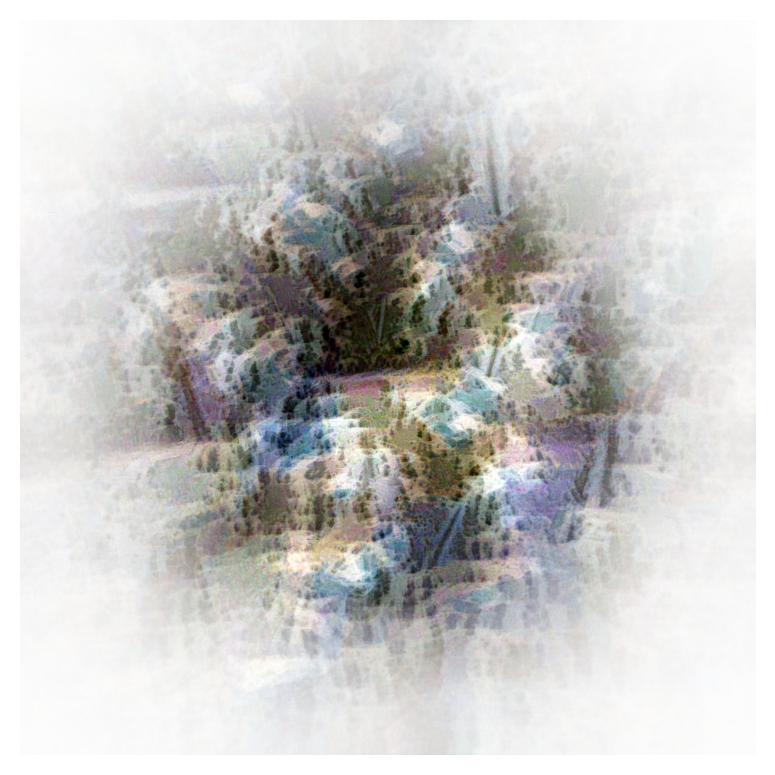

 25%|█████████▉                              | 506/2048 [00:18<04:54,  5.24it/s]

0.8404178023338318


 49%|███████████████████▍                    | 996/2048 [00:29<00:22, 45.87it/s]

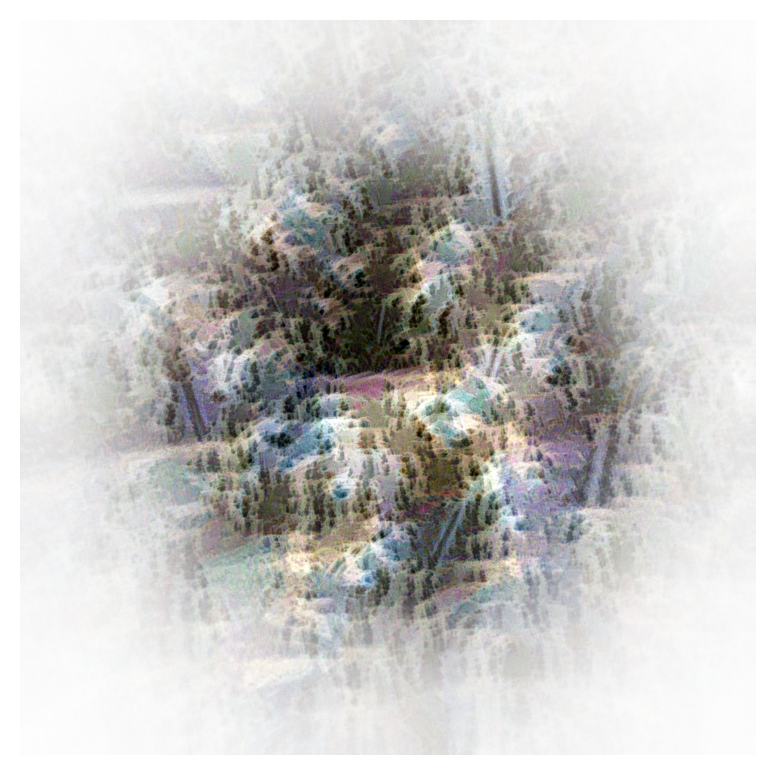

 49%|███████████████████▏                   | 1006/2048 [00:34<03:27,  5.03it/s]

0.6708183884620667


 73%|████████████████████████████▍          | 1496/2048 [00:44<00:11, 46.41it/s]

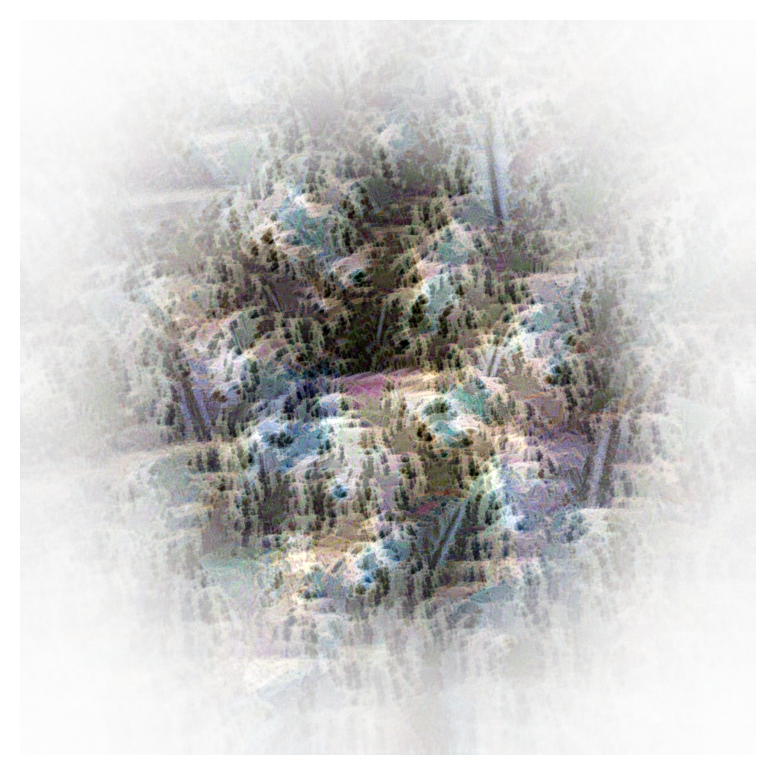

 74%|████████████████████████████▋          | 1506/2048 [00:49<01:48,  5.00it/s]

0.7321855425834656


 97%|██████████████████████████████████████ | 1996/2048 [00:59<00:01, 45.80it/s]

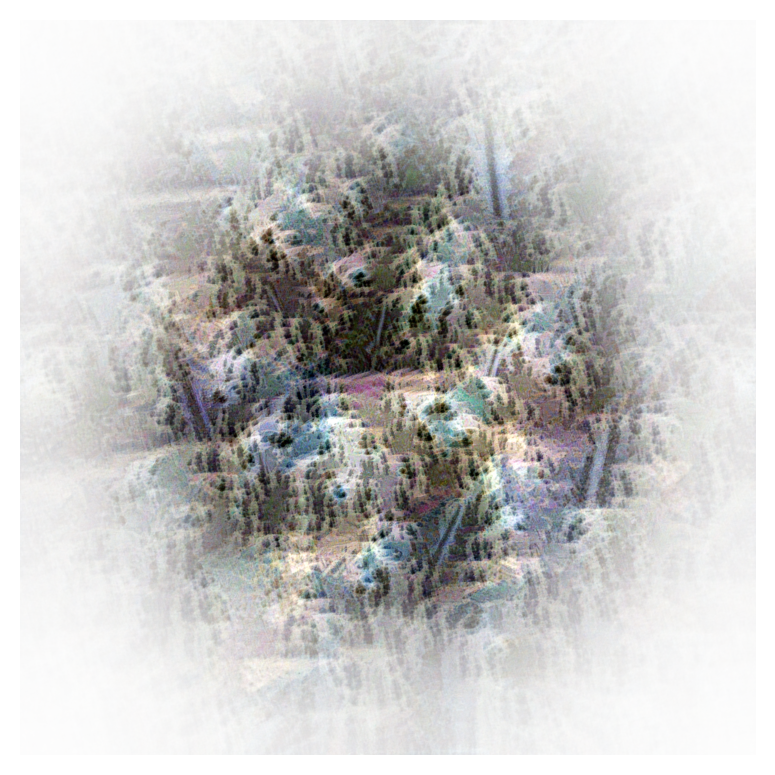

 98%|██████████████████████████████████████▏| 2006/2048 [01:04<00:08,  4.99it/s]

0.7893937230110168


100%|██████████████████████████████████████▉| 2046/2048 [01:05<00:00, 31.24it/s]

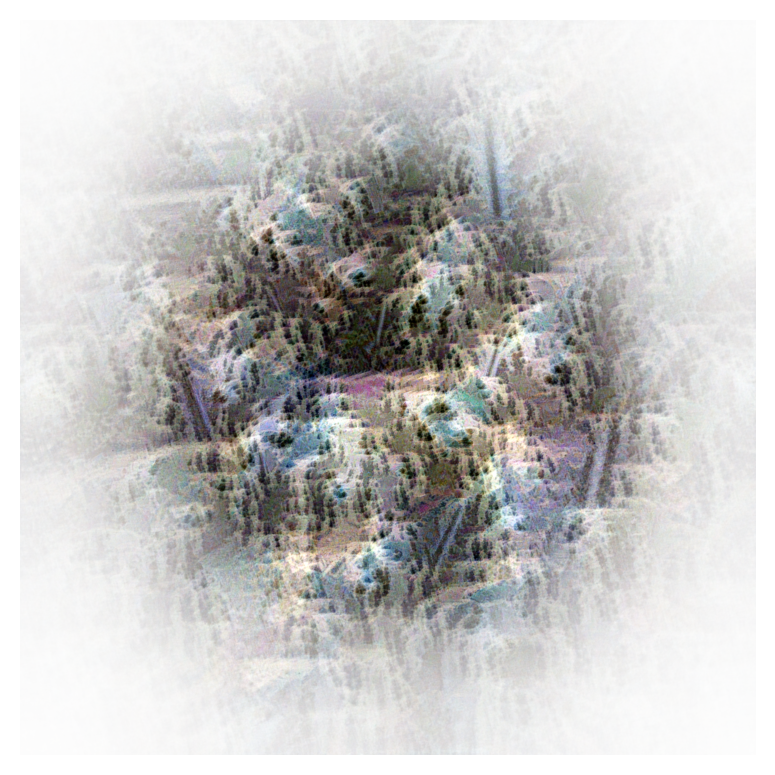

100%|███████████████████████████████████████| 2048/2048 [01:09<00:00, 29.55it/s]

0.6828646659851074


In [10]:
from tqdm import tqdm
import PIL
from PIL import Image

sz = 2048

optimizer_class = Nadam
learning_rate = 1.0
initialization_std = 1.0

nb_steps = 2048

# Works for every model that are approximately in the range (-1, 1)
noise_std = 0.080
box_average_size = tf.cast(np.linspace(0.45, 0.30, nb_steps), tf.float32)
box_size_std = 0.05

magnitude_template, phase = init_buffer(size=sz, std=initialization_std)
phase = tf.Variable(phase, trainable=True)
magnitude_alpha = tf.Variable(tf.zeros(magnitude_template.shape), trainable=True)

optimizer = optimizer_class(learning_rate)
transparency = tf.zeros((magnitude_template.shape[1], magnitude_template.shape[1], 3))
for i in tqdm(range(nb_steps)):

  grads, grads_img, grads_alpha, loss = up_neurons(model, magnitude_template, magnitude_alpha,
                                                            phase,
                                                            box_average_size=box_average_size[i],
                                                            box_size_std=box_size_std,
                                                            noise_std=noise_std,
                                                            nb_crops=8)
                                                            # nb_crops=32)
  optimizer.apply_gradients(zip([grads, grads_alpha], [phase, magnitude_alpha]))

  transparency += tf.abs(grads_img)

  if i == nb_steps-1 or (i+1) % 500 == 0: # if you want to plot every 25 steps
  #if i == nb_steps-1: # if you want to plot every 25 steps
    set_size(4, 4)
    img = fft_to_rgb(magnitude_template, magnitude_alpha, phase).numpy()
    viz = plot_alpha(img, transparency)
    plt.tight_layout()
    plt.show()
    print(float(loss))

### Make a baseline for a BeiT

In [11]:
model_beit = beit.BeitBasePatch16(input_shape=(384, 384, 3), pretrained="imagenet21k-ft1k", classifier_activation="linear")
model = tf.keras.Model(model_beit.input, model_beit.layers[-2].output)
MODEL_INPUT_SIZE = (384, 384)

347696424/347696424 [==============================] - 30s 0us/step
>>>> Load pretrained from: /home/agustin-martin.picard/.keras/models/beit_base_patch16_384_imagenet21k-ft1k.h5


 24%|█████████▋                              | 499/2048 [00:58<02:55,  8.83it/s]

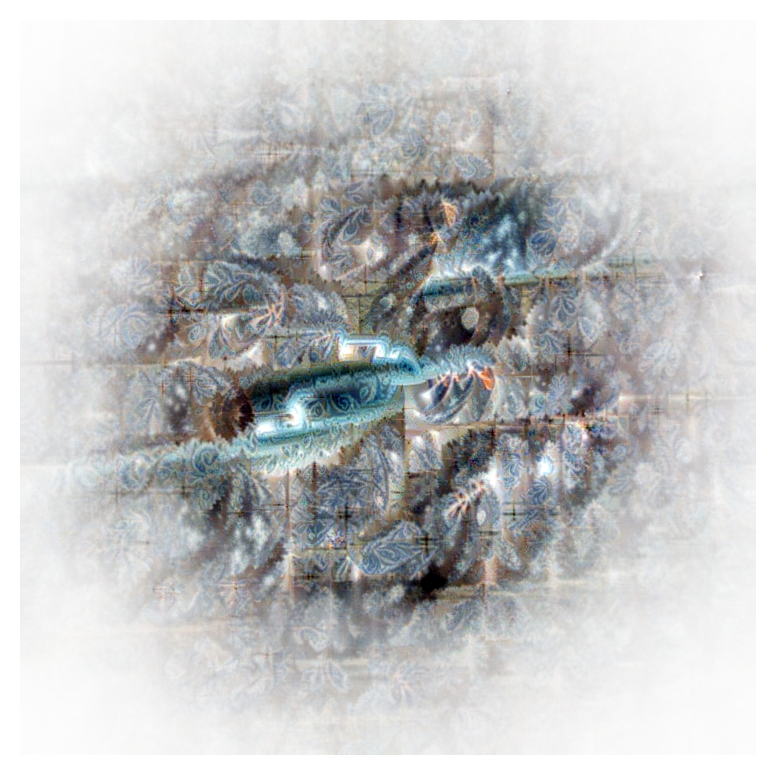

 24%|█████████▊                              | 501/2048 [01:03<26:06,  1.01s/it]

0.6454378962516785


 49%|███████████████████▌                    | 999/2048 [01:59<01:59,  8.81it/s]

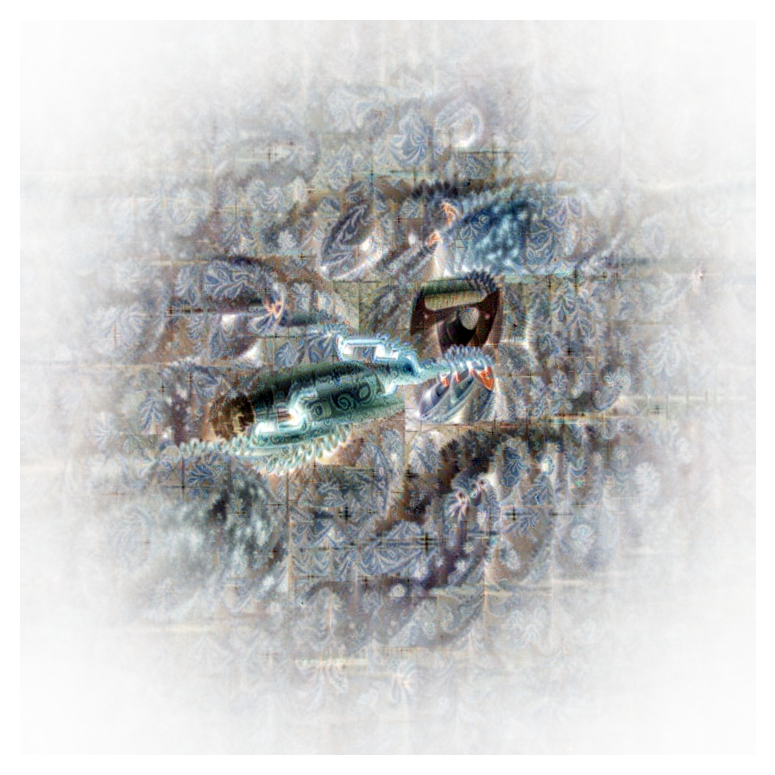

 49%|███████████████████                    | 1001/2048 [02:04<17:36,  1.01s/it]

0.5464224815368652


 73%|████████████████████████████▌          | 1499/2048 [03:00<01:02,  8.80it/s]

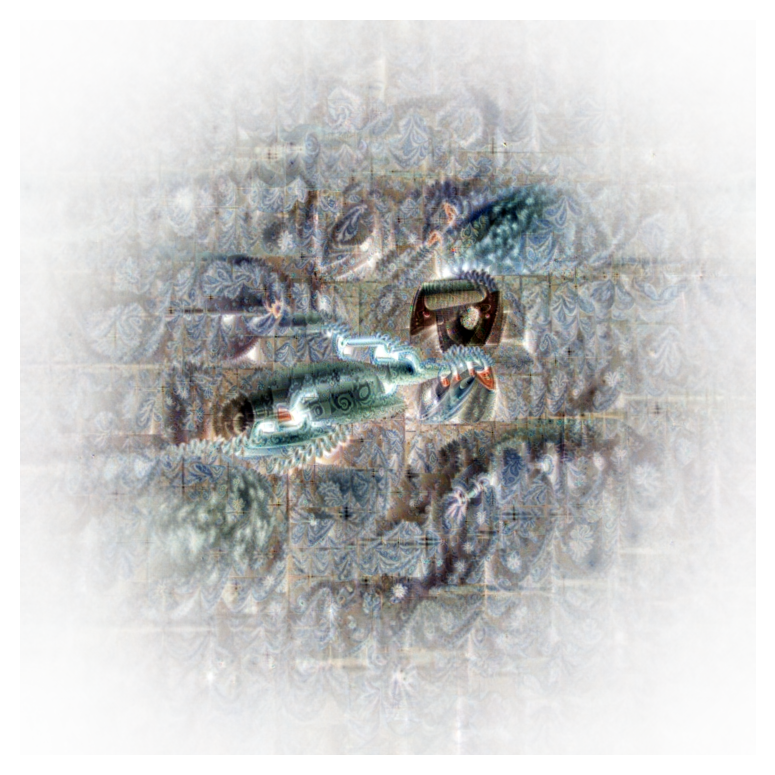

 73%|████████████████████████████▌          | 1501/2048 [03:04<09:09,  1.00s/it]

0.45662346482276917


 98%|██████████████████████████████████████ | 1999/2048 [04:01<00:05,  8.81it/s]

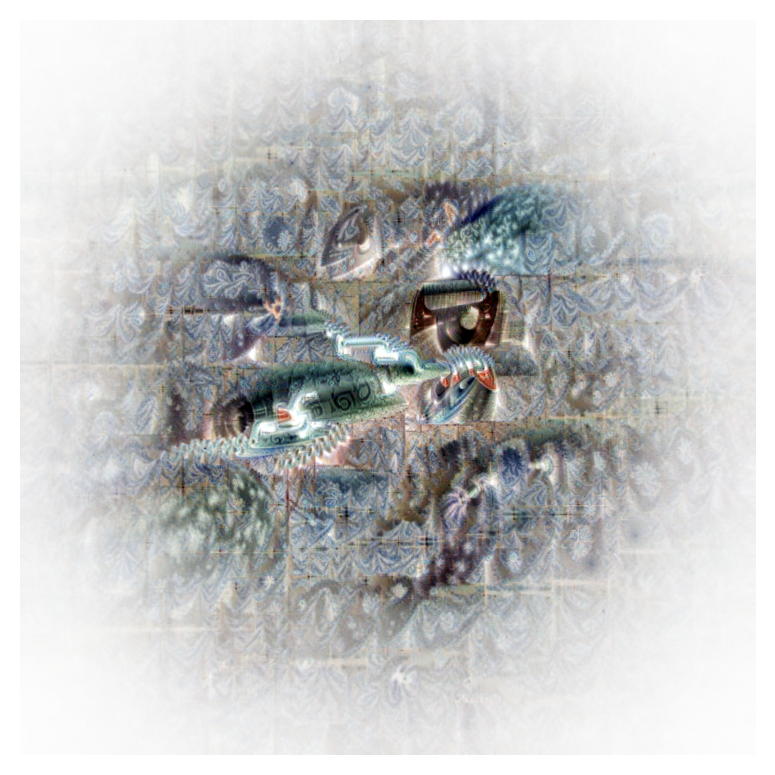

 98%|██████████████████████████████████████ | 2001/2048 [04:06<00:47,  1.01s/it]

0.4592081308364868


100%|██████████████████████████████████████▉| 2047/2048 [04:11<00:00,  8.80it/s]

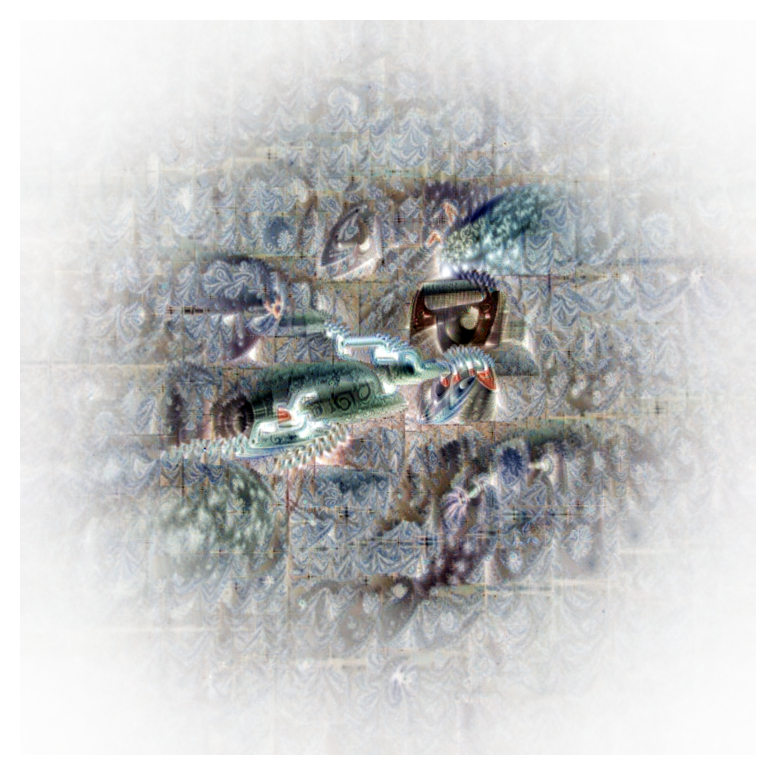

100%|███████████████████████████████████████| 2048/2048 [04:15<00:00,  8.01it/s]

0.5047327876091003


In [12]:
optimizer = optimizer_class(learning_rate)
transparency = tf.zeros((magnitude_template.shape[1], magnitude_template.shape[1], 3))
for i in tqdm(range(nb_steps)):

  grads, grads_img, grads_alpha, loss = up_neurons(model, magnitude_template, magnitude_alpha,
                                                            phase,
                                                            box_average_size=box_average_size[i],
                                                            box_size_std=box_size_std,
                                                            noise_std=noise_std,
                                                            nb_crops=8)
                                                            # nb_crops=32)
  optimizer.apply_gradients(zip([grads, grads_alpha], [phase, magnitude_alpha]))

  transparency += tf.abs(grads_img)

  if i == nb_steps-1 or (i+1) % 500 == 0: # if you want to plot every 25 steps
  #if i == nb_steps-1: # if you want to plot every 25 steps
    set_size(4, 4)
    img = fft_to_rgb(magnitude_template, magnitude_alpha, phase).numpy()
    viz = plot_alpha(img, transparency)
    plt.tight_layout()
    plt.show()
    print(float(loss))

### Make a baseline for ResNet50

In [15]:
model_r50 = tf.keras.applications.ResNet50V2(classifier_activation=None)
model = tf.keras.Model(model_r50.input, model_r50.layers[-2].output)
MODEL_INPUT_SIZE = (224, 224)

 24%|█████████▋                              | 499/2048 [00:14<00:36, 42.00it/s]

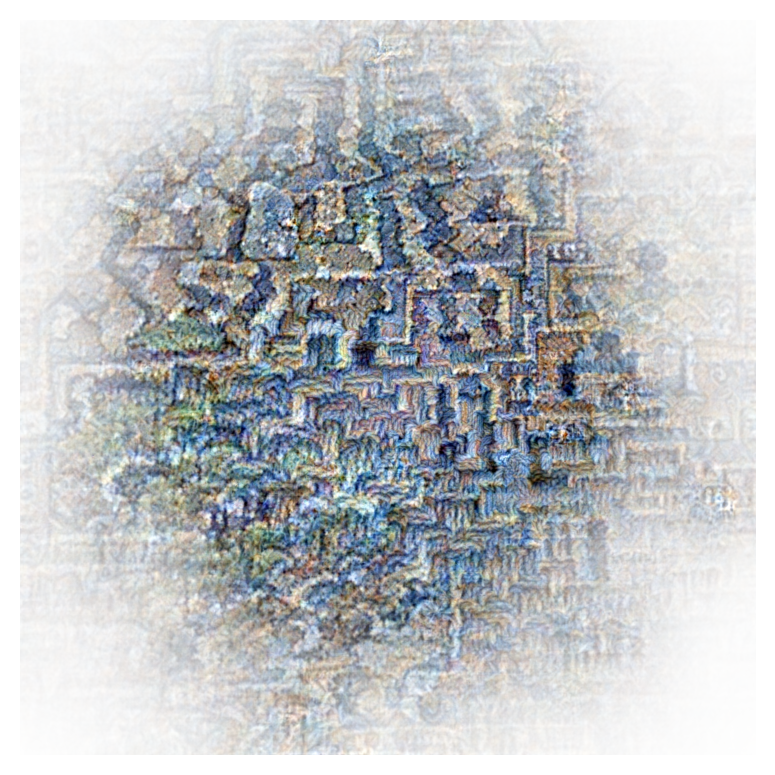

 25%|█████████▊                              | 504/2048 [00:18<07:07,  3.62it/s]

0.02894638106226921


 49%|███████████████████▍                    | 996/2048 [00:29<00:23, 43.92it/s]

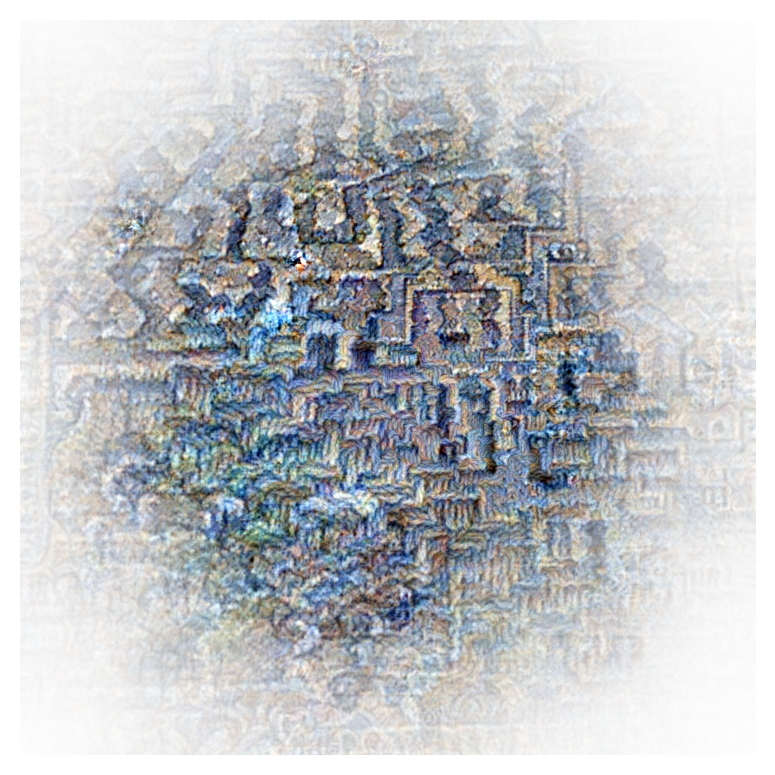

 49%|███████████████████▏                   | 1005/2048 [00:33<03:39,  4.76it/s]

0.04525811970233917


 73%|████████████████████████████▌          | 1499/2048 [00:46<00:15, 35.56it/s]

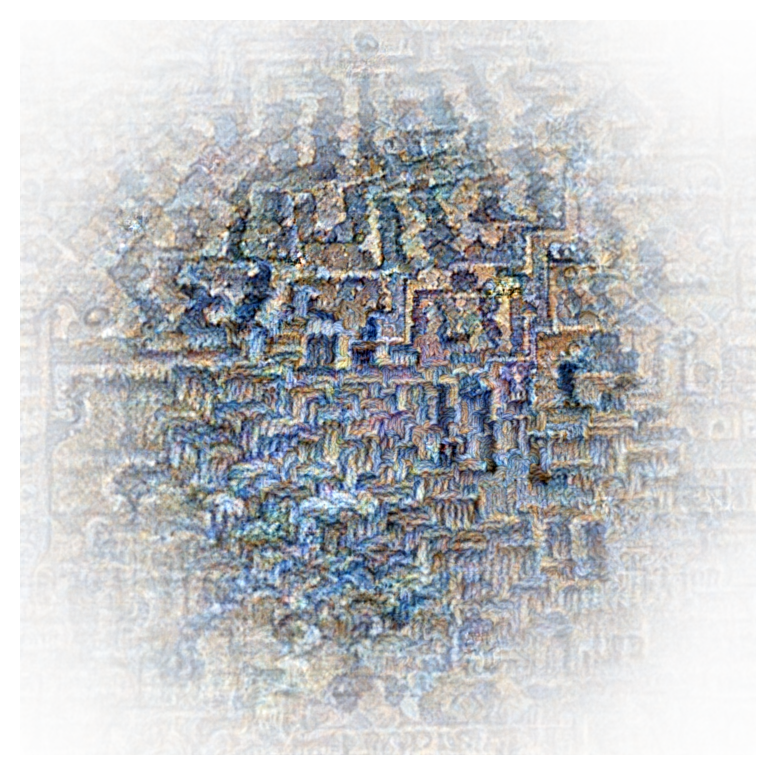

 74%|████████████████████████████▋          | 1508/2048 [00:51<02:03,  4.36it/s]

0.024803845211863518


 98%|██████████████████████████████████████ | 1999/2048 [01:05<00:01, 35.22it/s]

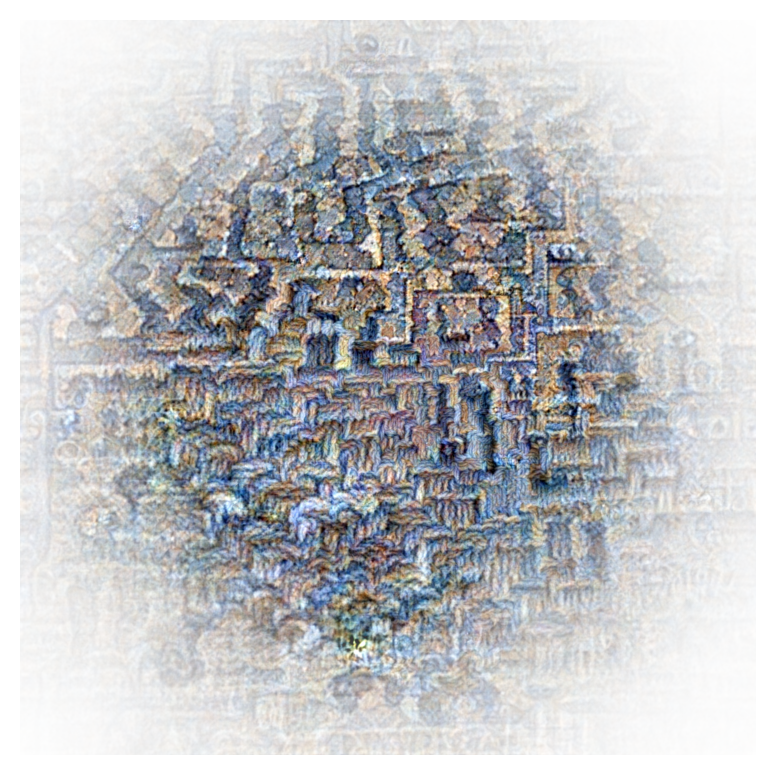

 98%|██████████████████████████████████████▏| 2007/2048 [01:09<00:10,  4.04it/s]

0.02115265652537346


100%|██████████████████████████████████████▉| 2047/2048 [01:10<00:00, 29.53it/s]

In [ ]:
optimizer = optimizer_class(learning_rate)
transparency = tf.zeros((magnitude_template.shape[1], magnitude_template.shape[1], 3))
for i in tqdm(range(nb_steps)):

  grads, grads_img, grads_alpha, loss = up_neurons(model, magnitude_template, magnitude_alpha,
                                                            phase,
                                                            box_average_size=box_average_size[i],
                                                            box_size_std=box_size_std,
                                                            noise_std=noise_std,
                                                            nb_crops=8)
                                                            # nb_crops=32)
  optimizer.apply_gradients(zip([grads, grads_alpha], [phase, magnitude_alpha]))

  transparency += tf.abs(grads_img)

  if i == nb_steps-1 or (i+1) % 500 == 0: # if you want to plot every 25 steps
  #if i == nb_steps-1: # if you want to plot every 25 steps
    set_size(4, 4)
    img = fft_to_rgb(magnitude_template, magnitude_alpha, phase).numpy()
    viz = plot_alpha(img, transparency)
    plt.tight_layout()
    plt.show()
    print(float(loss))